# Gradient and Boundary Analysis

Deep dive into the 40,401-point dataset (201×201 grid, α,β ∈ [-1, +1]).

**Analyses:**
1. High-resolution contour plot
2. Gradient magnitude map (reveals ALL boundaries)
3. Gradient direction field
4. Statistical properties of the landscape

In [63]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import sobel
from scipy import stats

## Load Data

In [64]:
# Load the massive dataset
df = pd.read_csv('data/qwen_2d_grid_results.csv')

print(f"Loaded {len(df):,} data points")
print(f"Alpha range: [{df['alpha'].min():.2f}, {df['alpha'].max():.2f}]")
print(f"Beta range: [{df['beta'].min():.2f}, {df['beta'].max():.2f}]")
print(f"Grade level range: [{df['flesch_kincaid_grade'].min():.2f}, {df['flesch_kincaid_grade'].max():.2f}]")
print(f"Grid resolution: {df['alpha'].nunique()} × {df['beta'].nunique()}")

# Reshape into 2D grid
pivot = df.pivot(index='beta', columns='alpha', values='flesch_kincaid_grade')
X = pivot.columns.values
Y = pivot.index.values
X_grid, Y_grid = np.meshgrid(X, Y)
Z = pivot.values

print(f"\nGrid shape: {Z.shape}")
print(f"Resolution: {X[1] - X[0]:.4f} units per step")

Loaded 40,401 data points
Alpha range: [-1.00, 1.00]
Beta range: [-1.00, 1.00]
Grade level range: [8.27, 16.70]
Grid resolution: 201 × 201

Grid shape: (201, 201)
Resolution: 0.0100 units per step


## 1. High-Resolution Contour Plot

Black and white topographic map showing the full [-1, +1] region.

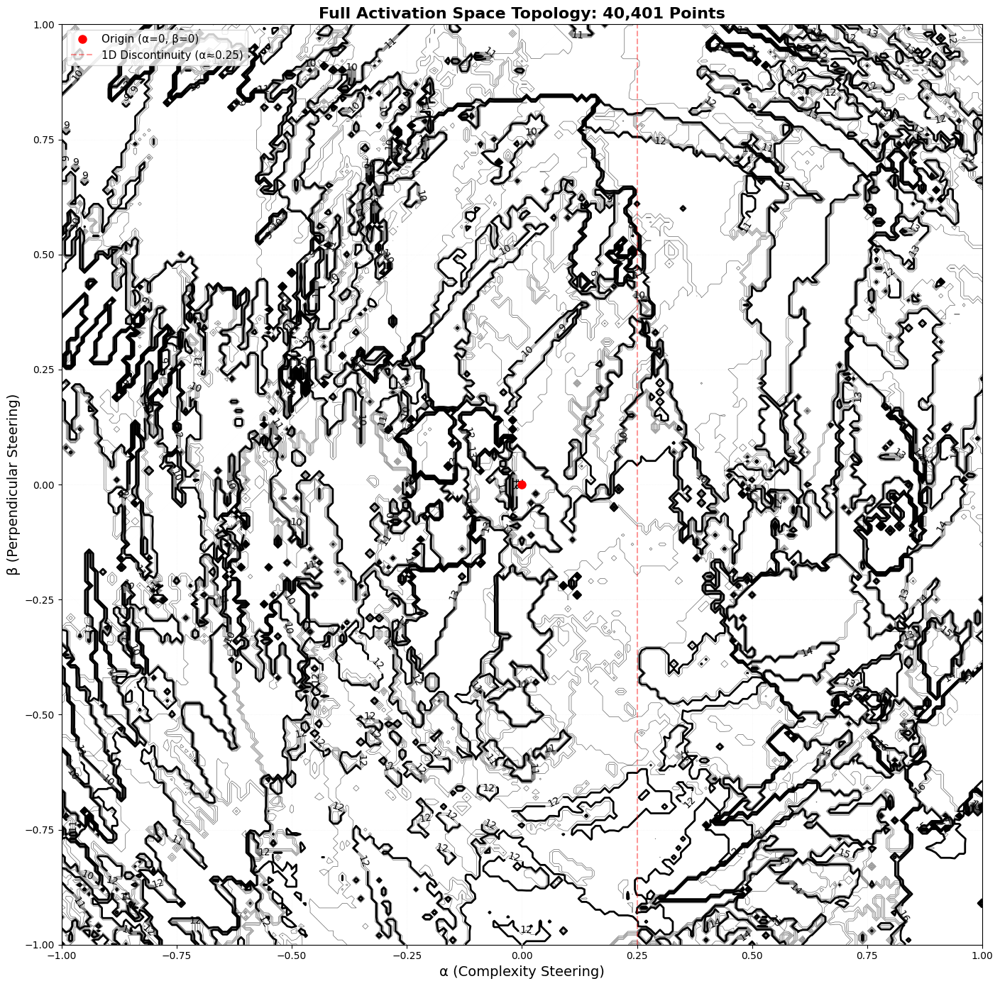

Contour density reveals gradient steepness:
  Dense contours = steep gradient (phase boundaries)
  Sparse contours = gentle gradient (stable regimes)


In [65]:
fig, ax = plt.subplots(figsize=(16, 14))

# Fine contours every 0.2 grade levels
levels_fine = np.arange(8, 16.2, 0.2)
contour_fine = ax.contour(X_grid, Y_grid, Z, levels=levels_fine, 
                          colors='black', linewidths=0.5, alpha=0.6)

# Major contours at integer grade levels
levels_major = np.arange(8, 17, 1)
contour_major = ax.contour(X_grid, Y_grid, Z, levels=levels_major, 
                           colors='black', linewidths=2)
ax.clabel(contour_major, inline=True, fontsize=10, fmt='%0.0f')

# Mark the origin
ax.plot(0, 0, 'ro', markersize=8, label='Origin (α=0, β=0)', zorder=5)

# Mark the 1D discontinuity
ax.axvline(0.25, color='red', linestyle='--', linewidth=1.5, alpha=0.4, 
          label='1D Discontinuity (α≈0.25)')

# Labels
ax.set_xlabel('α (Complexity Steering)', fontsize=14)
ax.set_ylabel('β (Perpendicular Steering)', fontsize=14)
ax.set_title('Full Activation Space Topology: 40,401 Points', fontsize=16, fontweight='bold')
ax.legend(loc='upper left', fontsize=11)
ax.grid(True, alpha=0.2, linestyle=':', linewidth=0.5)
ax.set_aspect('equal')

plt.tight_layout()
plt.show()

print("Contour density reveals gradient steepness:")
print("  Dense contours = steep gradient (phase boundaries)")
print("  Sparse contours = gentle gradient (stable regimes)")

## 2. Gradient Magnitude Map

Calculate ∇(grade_level) to find all boundaries and discontinuities.

Gradient statistics:
  Mean magnitude: 2.9914
  Std magnitude: 7.0303
  Max magnitude: 68.5065
  95th percentile: 8.6529


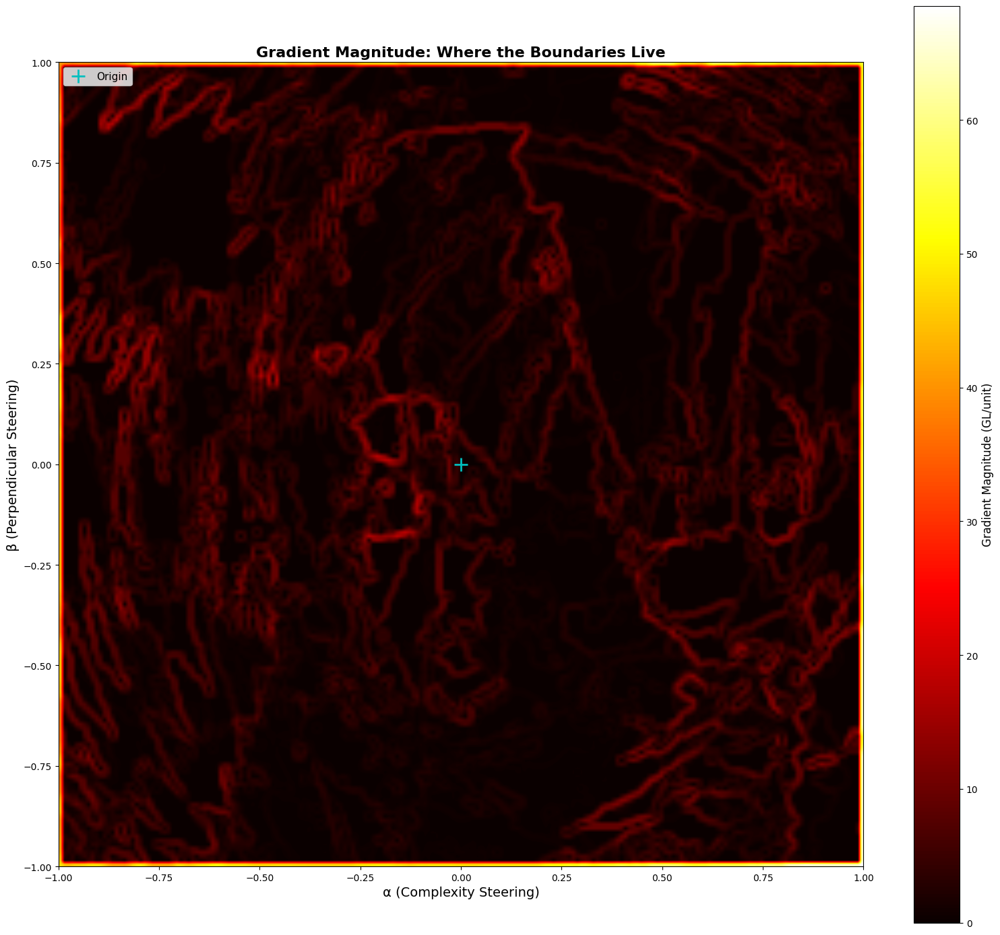


Bright regions = steep changes (discontinuities/boundaries)
Dark regions = flat terrain (stable attractors)


In [66]:
# Calculate gradients using Sobel operators
grad_alpha = sobel(Z, axis=1, mode='constant')  # Gradient in α direction
grad_beta = sobel(Z, axis=0, mode='constant')   # Gradient in β direction
grad_magnitude = np.sqrt(grad_alpha**2 + grad_beta**2)

print(f"Gradient statistics:")
print(f"  Mean magnitude: {grad_magnitude.mean():.4f}")
print(f"  Std magnitude: {grad_magnitude.std():.4f}")
print(f"  Max magnitude: {grad_magnitude.max():.4f}")
print(f"  95th percentile: {np.percentile(grad_magnitude, 95):.4f}")

# Plot gradient magnitude
fig, ax = plt.subplots(figsize=(16, 14))

# Use log scale to see both subtle and sharp boundaries
im = ax.imshow(grad_magnitude, cmap='hot', aspect='auto', origin='lower',
               extent=[-1, 1, -1, 1], interpolation='bilinear')

# Colorbar
cbar = plt.colorbar(im, ax=ax)
cbar.set_label('Gradient Magnitude (GL/unit)', fontsize=12)

# Mark origin
ax.plot(0, 0, 'c+', markersize=15, markeredgewidth=2, label='Origin')

# Labels
ax.set_xlabel('α (Complexity Steering)', fontsize=14)
ax.set_ylabel('β (Perpendicular Steering)', fontsize=14)
ax.set_title('Gradient Magnitude: Where the Boundaries Live', fontsize=16, fontweight='bold')
ax.legend(loc='upper left', fontsize=11)
ax.set_aspect('equal')

plt.tight_layout()
plt.show()

print("\nBright regions = steep changes (discontinuities/boundaries)")
print("Dark regions = flat terrain (stable attractors)")

## 3. Gradient Direction Field

Show which way the gradient points - the direction of steepest ascent.

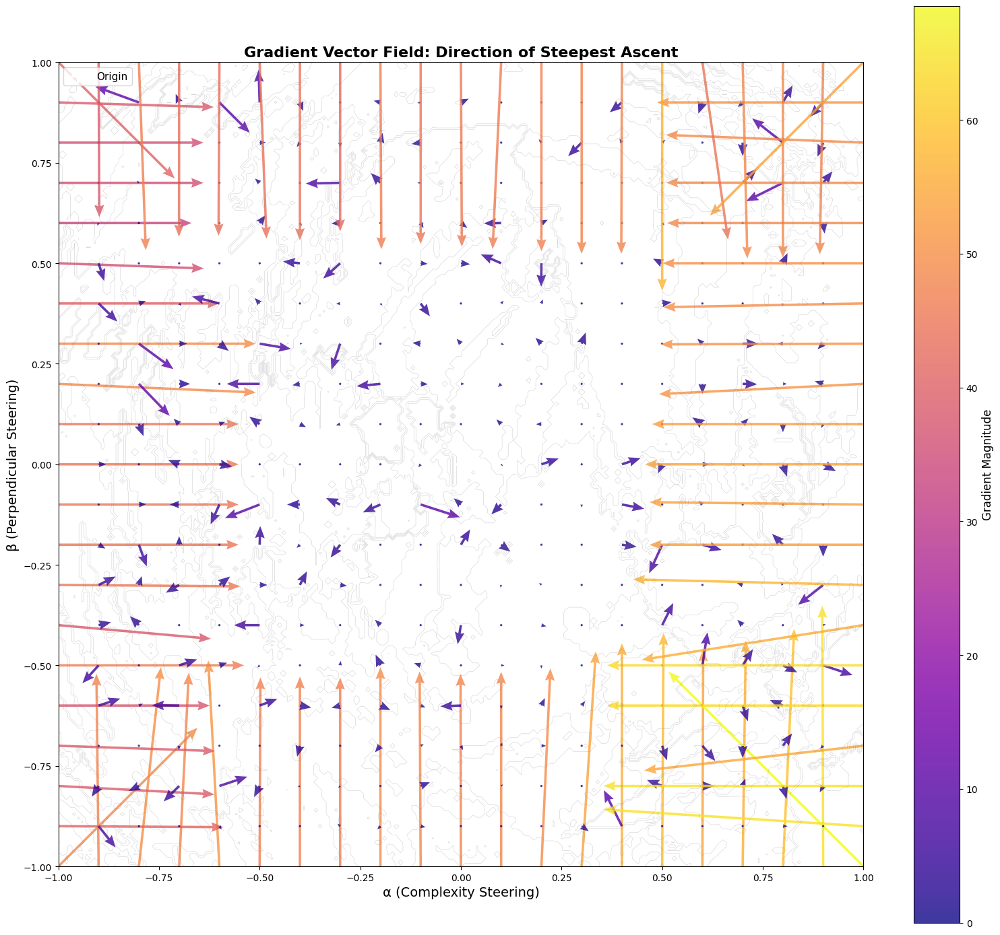

Arrows point in direction of increasing grade level
Arrow color/length indicates gradient strength


In [67]:
# Subsample for visualization (every Nth point)
skip = 10  # Show every 10th point
X_sub = X_grid[::skip, ::skip]
Y_sub = Y_grid[::skip, ::skip]
U_sub = grad_alpha[::skip, ::skip]
V_sub = grad_beta[::skip, ::skip]
M_sub = grad_magnitude[::skip, ::skip]

fig, ax = plt.subplots(figsize=(16, 14))

# Background: grade level as faint contours
levels_bg = np.arange(8, 17, 1)
ax.contour(X_grid, Y_grid, Z, levels=levels_bg, 
          colors='gray', linewidths=0.5, alpha=0.3)

# Quiver plot colored by gradient magnitude
quiv = ax.quiver(X_sub, Y_sub, U_sub, V_sub, M_sub,
                cmap='plasma', scale=200, width=0.003, 
                headwidth=4, headlength=5, alpha=0.8)

# Colorbar
cbar = plt.colorbar(quiv, ax=ax)
cbar.set_label('Gradient Magnitude', fontsize=12)

# Mark origin
ax.plot(0, 0, 'w+', markersize=15, markeredgewidth=3, label='Origin')

# Labels
ax.set_xlabel('α (Complexity Steering)', fontsize=14)
ax.set_ylabel('β (Perpendicular Steering)', fontsize=14)
ax.set_title('Gradient Vector Field: Direction of Steepest Ascent', fontsize=16, fontweight='bold')
ax.legend(loc='upper left', fontsize=11)
ax.set_aspect('equal')
ax.set_xlim(-1, 1)
ax.set_ylim(-1, 1)

plt.tight_layout()
plt.show()

print("Arrows point in direction of increasing grade level")
print("Arrow color/length indicates gradient strength")

## 4. Statistical Landscape Analysis

Characterize the overall topology.

Grade Level Distribution:
  Mean: 11.54
  Median: 11.62
  Std: 1.59
  Min: 8.27
  Max: 16.70
  Range: 8.43
  Skewness: 0.49
  Kurtosis: 0.58


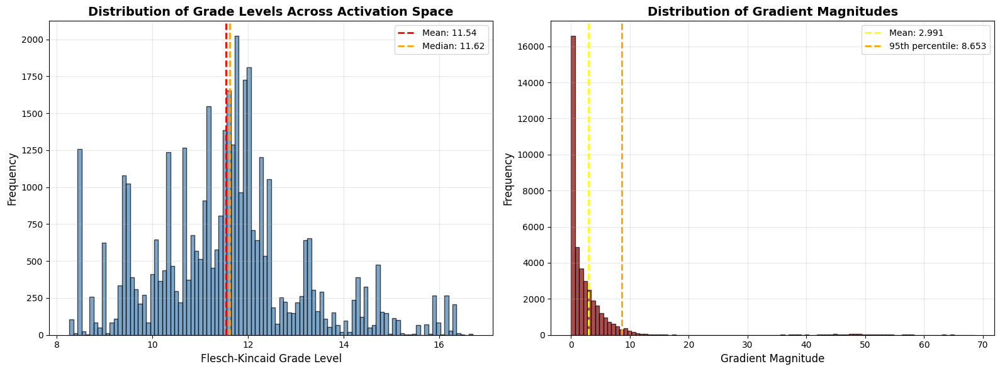


Terrain Classification (threshold = 75th percentile):
  Flat regions: 75.0%
  Steep regions (boundaries): 25.0%


In [68]:
# Basic statistics
print("Grade Level Distribution:")
print(f"  Mean: {Z.mean():.2f}")
print(f"  Median: {np.median(Z):.2f}")
print(f"  Std: {Z.std():.2f}")
print(f"  Min: {Z.min():.2f}")
print(f"  Max: {Z.max():.2f}")
print(f"  Range: {Z.max() - Z.min():.2f}")
print(f"  Skewness: {stats.skew(Z.flatten()):.2f}")
print(f"  Kurtosis: {stats.kurtosis(Z.flatten()):.2f}")

# Histogram
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Grade level histogram
ax1.hist(Z.flatten(), bins=100, color='steelblue', edgecolor='black', alpha=0.7)
ax1.axvline(Z.mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {Z.mean():.2f}')
ax1.axvline(np.median(Z), color='orange', linestyle='--', linewidth=2, label=f'Median: {np.median(Z):.2f}')
ax1.set_xlabel('Flesch-Kincaid Grade Level', fontsize=12)
ax1.set_ylabel('Frequency', fontsize=12)
ax1.set_title('Distribution of Grade Levels Across Activation Space', fontsize=14, fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3)

# Gradient magnitude histogram
ax2.hist(grad_magnitude.flatten(), bins=100, color='darkred', edgecolor='black', alpha=0.7)
ax2.axvline(grad_magnitude.mean(), color='yellow', linestyle='--', linewidth=2, 
           label=f'Mean: {grad_magnitude.mean():.3f}')
ax2.axvline(np.percentile(grad_magnitude, 95), color='orange', linestyle='--', linewidth=2,
           label=f'95th percentile: {np.percentile(grad_magnitude, 95):.3f}')
ax2.set_xlabel('Gradient Magnitude', fontsize=12)
ax2.set_ylabel('Frequency', fontsize=12)
ax2.set_title('Distribution of Gradient Magnitudes', fontsize=14, fontweight='bold')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Count how much of the space is "flat" vs "steep"
threshold = np.percentile(grad_magnitude, 75)
flat_fraction = (grad_magnitude < threshold).sum() / grad_magnitude.size
steep_fraction = 1 - flat_fraction

print(f"\nTerrain Classification (threshold = 75th percentile):")
print(f"  Flat regions: {flat_fraction*100:.1f}%")
print(f"  Steep regions (boundaries): {steep_fraction*100:.1f}%")

## 5. Radial Analysis

How does grade level vary with distance from origin?

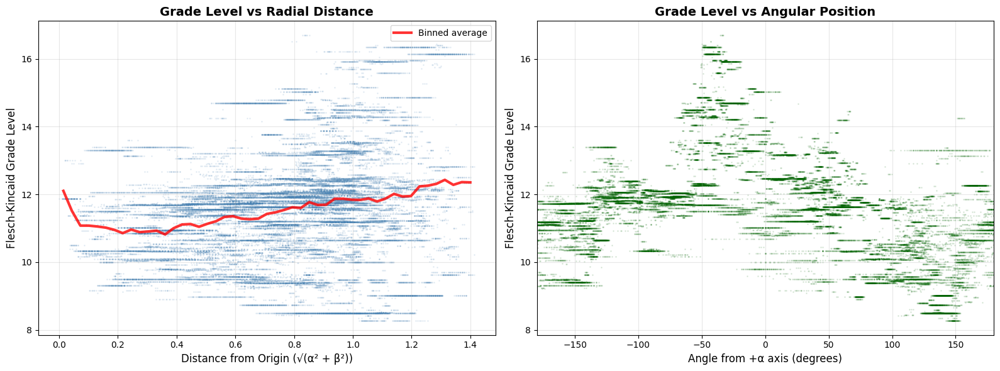

Radial symmetry check: Does grade level depend on distance from origin?
Angular symmetry check: Does it depend on direction?


In [69]:
# Calculate distance from origin for each point
df['distance'] = np.sqrt(df['alpha']**2 + df['beta']**2)
df['angle'] = np.arctan2(df['beta'], df['alpha']) * 180 / np.pi  # In degrees

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Grade level vs distance from origin
ax1.scatter(df['distance'], df['flesch_kincaid_grade'], 
           alpha=0.1, s=1, c='steelblue')
ax1.set_xlabel('Distance from Origin (√(α² + β²))', fontsize=12)
ax1.set_ylabel('Flesch-Kincaid Grade Level', fontsize=12)
ax1.set_title('Grade Level vs Radial Distance', fontsize=14, fontweight='bold')
ax1.grid(True, alpha=0.3)

# Binned average
distance_bins = np.linspace(0, df['distance'].max(), 50)
binned_stats = stats.binned_statistic(df['distance'], df['flesch_kincaid_grade'], 
                                      statistic='mean', bins=distance_bins)
bin_centers = (distance_bins[:-1] + distance_bins[1:]) / 2
ax1.plot(bin_centers, binned_stats.statistic, 'r-', linewidth=3, 
        label='Binned average', alpha=0.8)
ax1.legend()

# Grade level vs angle
ax2.scatter(df['angle'], df['flesch_kincaid_grade'], 
           alpha=0.1, s=1, c='darkgreen')
ax2.set_xlabel('Angle from +α axis (degrees)', fontsize=12)
ax2.set_ylabel('Flesch-Kincaid Grade Level', fontsize=12)
ax2.set_title('Grade Level vs Angular Position', fontsize=14, fontweight='bold')
ax2.grid(True, alpha=0.3)
ax2.set_xlim(-180, 180)

plt.tight_layout()
plt.show()

print("Radial symmetry check: Does grade level depend on distance from origin?")
print("Angular symmetry check: Does it depend on direction?")

## 6. Interactive 3D Visualization

Explore the activation space landscape interactively using Plotly.

In [70]:
import plotly.graph_objects as go

# Load fresh data (in case running this cell standalone)
df_plot = pd.read_csv('data/qwen_2d_grid_results.csv')

print(f"Creating interactive 3D plot with {len(df_plot):,} points...")

# Create 3D scatter plot
fig = go.Figure(data=[go.Scatter3d(
    x=df_plot['alpha'],
    y=df_plot['beta'],
    z=df_plot['flesch_kincaid_grade'],
    mode='markers',
    marker=dict(
        size=2,
        color=df_plot['flesch_kincaid_grade'],
        colorscale='Viridis',
        showscale=True,
        colorbar=dict(title="Grade Level"),
        opacity=0.8
    ),
    text=[f"α={a:.2f}<br>β={b:.2f}<br>GL={g:.2f}" 
          for a, b, g in zip(df_plot['alpha'], df_plot['beta'], df_plot['flesch_kincaid_grade'])],
    hoverinfo='text'
)])

# Layout
fig.update_layout(
    title='Interactive 3D Activation Space Landscape',
    scene=dict(
        xaxis_title='α (Complexity Steering)',
        yaxis_title='β (Perpendicular Steering)',
        zaxis_title='Flesch-Kincaid Grade Level',
        camera=dict(
            eye=dict(x=1.5, y=1.5, z=1.3)
        )
    ),
    width=1200,
    height=900,
    hovermode='closest'
)

fig.show()

print("\nInteractive controls:")
print("  • Click and drag to rotate")
print("  • Scroll to zoom")
print("  • Hover over points to see exact values")
print("  • Use the camera controls in the toolbar")

Creating interactive 3D plot with 40,401 points...



Interactive controls:
  • Click and drag to rotate
  • Scroll to zoom
  • Hover over points to see exact values
  • Use the camera controls in the toolbar


In [71]:
# Alternative: 3D surface plot (smoother visualization)
# This interpolates between points for a continuous surface

# Reshape data
pivot_3d = df_plot.pivot(index='beta', columns='alpha', values='flesch_kincaid_grade')
X_3d = pivot_3d.columns.values
Y_3d = pivot_3d.index.values
Z_3d = pivot_3d.values

fig_surface = go.Figure(data=[go.Surface(
    x=X_3d,
    y=Y_3d,
    z=Z_3d,
    colorscale='Viridis',
    colorbar=dict(title="Grade Level"),
    hovertemplate='α: %{x:.2f}<br>β: %{y:.2f}<br>GL: %{z:.2f}<extra></extra>'
)])

fig_surface.update_layout(
    title='Interactive 3D Surface: Activation Space Landscape',
    scene=dict(
        xaxis_title='α (Complexity Steering)',
        yaxis_title='β (Perpendicular Steering)',
        zaxis_title='Flesch-Kincaid Grade Level',
        camera=dict(
            eye=dict(x=1.5, y=1.5, z=1.3)
        )
    ),
    width=1200,
    height=900
)

fig_surface.show()

print("\nSurface plot shows the continuous landscape.")
print("Rotate it to see the topography from different angles!")


Surface plot shows the continuous landscape.
Rotate it to see the topography from different angles!


In [72]:
# Flattened version: Scale down the Z-axis for easier interpretation
# This compresses vertical differences to see the overall structure better

Z_SCALE_FACTOR = 0.1  # Compress vertical scale by 10x

# Scatter plot - flattened with reference planes
fig_scatter_flat = go.Figure()

# Add the data points
fig_scatter_flat.add_trace(go.Scatter3d(
    x=df_plot['alpha'],
    y=df_plot['beta'],
    z=df_plot['flesch_kincaid_grade'] * Z_SCALE_FACTOR,
    mode='markers',
    marker=dict(
        size=2,
        color=df_plot['flesch_kincaid_grade'],
        colorscale='Viridis',
        showscale=True,
        colorbar=dict(title="Grade Level<br>(actual)"),
        opacity=0.8
    ),
    text=[f"α={a:.2f}<br>β={b:.2f}<br>GL={g:.2f}" 
          for a, b, g in zip(df_plot['alpha'], df_plot['beta'], df_plot['flesch_kincaid_grade'])],
    hoverinfo='text',
    name='Data'
))

# Add β=0 plane (translucent)
z_range = [df_plot['flesch_kincaid_grade'].min() * Z_SCALE_FACTOR, 
           df_plot['flesch_kincaid_grade'].max() * Z_SCALE_FACTOR]
fig_scatter_flat.add_trace(go.Surface(
    x=[-1, 1],
    y=[0, 0],
    z=[[z_range[0], z_range[0]], [z_range[1], z_range[1]]],
    showscale=False,
    opacity=0.2,
    colorscale=[[0, 'lightblue'], [1, 'lightblue']],
    name='β=0 plane',
    hoverinfo='skip'
))

# Add α=0 plane (translucent)
fig_scatter_flat.add_trace(go.Surface(
    x=[0, 0],
    y=[-1, 1],
    z=[[z_range[0], z_range[0]], [z_range[1], z_range[1]]],
    showscale=False,
    opacity=0.2,
    colorscale=[[0, 'pink'], [1, 'pink']],
    name='α=0 plane',
    hoverinfo='skip'
))

fig_scatter_flat.update_layout(
    title=f'Interactive 3D Scatter (Z-axis scaled {Z_SCALE_FACTOR}x) with Reference Planes',
    scene=dict(
        xaxis_title='α (Complexity Steering)',
        yaxis_title='β (Perpendicular Steering)',
        zaxis_title=f'Grade Level (×{Z_SCALE_FACTOR})',
        camera=dict(
            eye=dict(x=1.5, y=1.5, z=1.3)
        ),
        aspectmode='manual',
        aspectratio=dict(x=1, y=1, z=0.5)  # Make Z axis relatively shorter
    ),
    width=1200,
    height=900,
    hovermode='closest'
)

fig_scatter_flat.show()

# Surface plot - flattened with reference planes
Z_3d_flat = Z_3d * Z_SCALE_FACTOR

fig_surface_flat = go.Figure()

# Add the surface
fig_surface_flat.add_trace(go.Surface(
    x=X_3d,
    y=Y_3d,
    z=Z_3d_flat,
    surfacecolor=Z_3d,  # Color by actual values
    colorscale='Viridis',
    colorbar=dict(title="Grade Level<br>(actual)"),
    hovertemplate='α: %{x:.2f}<br>β: %{y:.2f}<br>GL: %{surfacecolor:.2f}<extra></extra>',
    name='Grade Level Surface'
))

# Add β=0 plane (translucent)
fig_surface_flat.add_trace(go.Surface(
    x=[-1, 1],
    y=[0, 0],
    z=[[z_range[0], z_range[0]], [z_range[1], z_range[1]]],
    showscale=False,
    opacity=0.2,
    colorscale=[[0, 'lightblue'], [1, 'lightblue']],
    name='β=0 plane',
    hoverinfo='skip'
))

# Add α=0 plane (translucent)
fig_surface_flat.add_trace(go.Surface(
    x=[0, 0],
    y=[-1, 1],
    z=[[z_range[0], z_range[0]], [z_range[1], z_range[1]]],
    showscale=False,
    opacity=0.2,
    colorscale=[[0, 'pink'], [1, 'pink']],
    name='α=0 plane',
    hoverinfo='skip'
))

fig_surface_flat.update_layout(
    title=f'Interactive 3D Surface (Z-axis scaled {Z_SCALE_FACTOR}x) with Reference Planes',
    scene=dict(
        xaxis_title='α (Complexity Steering)',
        yaxis_title='β (Perpendicular Steering)',
        zaxis_title=f'Grade Level (×{Z_SCALE_FACTOR})',
        camera=dict(
            eye=dict(x=1.5, y=1.5, z=1.3)
        ),
        aspectmode='manual',
        aspectratio=dict(x=1, y=1, z=0.5)
    ),
    width=1200,
    height=900
)

fig_surface_flat.show()

print(f"\nZ-axis compressed by factor of {Z_SCALE_FACTOR} for easier interpretation")
print("Colors still represent actual grade level values")
print("\nReference planes:")
print("  • Light blue plane: β=0 (pure complexity steering)")
print("  • Pink plane: α=0 (pure perpendicular steering)")
print("\nThese help you see where you cross the axes as you rotate the view!")


Z-axis compressed by factor of 0.1 for easier interpretation
Colors still represent actual grade level values

Reference planes:
  • Light blue plane: β=0 (pure complexity steering)
  • Pink plane: α=0 (pure perpendicular steering)

These help you see where you cross the axes as you rotate the view!


## 7. Bathymetric Map

Classic ocean-floor style visualization showing depth (grade level) with color.

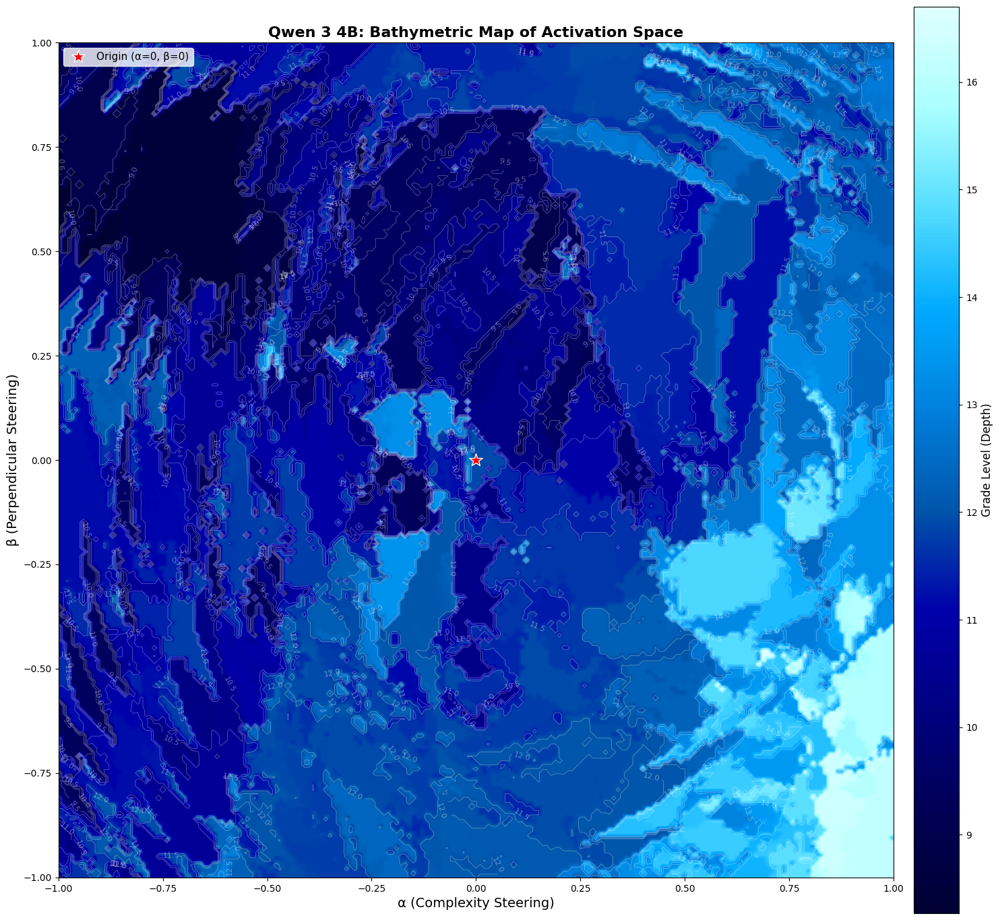

Bathymetric visualization:
  Deep blue (almost black) = low grade level (simple)
  Pale cyan/white = high grade level (complex)
  White contour lines every 0.5 grade levels


In [73]:
# Bathymetric map using deep ocean colormap
# Dark blue (almost black) at low values -> pale cyan at high values
from matplotlib.colors import LinearSegmentedColormap

# Create custom bathymetric colormap
colors = ['#000033', '#000055', '#000080', '#0000AA', '#0055AA', '#0080DD', '#00AAFF', '#55DDFF', '#AAFFFF', '#E0FFFF']
n_bins = 256
cmap_bathy = LinearSegmentedColormap.from_list('bathymetry', colors, N=n_bins)

fig, ax = plt.subplots(figsize=(16, 14))

# Use imshow with custom bathymetric colormap
im = ax.imshow(Z, cmap=cmap_bathy, aspect='auto', origin='lower',
               extent=[-1, 1, -1, 1], interpolation='bilinear')

# Add contour lines for depth
contour_levels = np.arange(9, 17, 0.5)
contours = ax.contour(X_grid, Y_grid, Z, levels=contour_levels,
                     colors='white', linewidths=0.5, alpha=0.4)
ax.clabel(contours, inline=True, fontsize=8, fmt='%0.1f', colors='white')

# Mark origin
ax.plot(0, 0, 'r*', markersize=15, markeredgewidth=1, markeredgecolor='white', 
        label='Origin (α=0, β=0)', zorder=5)

# Colorbar with bathymetric style
cbar = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.02)
cbar.set_label('Grade Level (Depth)', fontsize=12)

# Labels
ax.set_xlabel('α (Complexity Steering)', fontsize=14)
ax.set_ylabel('β (Perpendicular Steering)', fontsize=14)
ax.set_title('Qwen 3 4B: Bathymetric Map of Activation Space', fontsize=16, fontweight='bold')
ax.legend(loc='upper left', fontsize=11, facecolor='white', edgecolor='white')
ax.set_aspect('equal')

plt.tight_layout()
plt.show()

print("Bathymetric visualization:")
print("  Deep blue (almost black) = low grade level (simple)")
print("  Pale cyan/white = high grade level (complex)")
print("  White contour lines every 0.5 grade levels")

## 8. Diagonal Trend Analysis

Is there a systematic bias along the α+β diagonal?

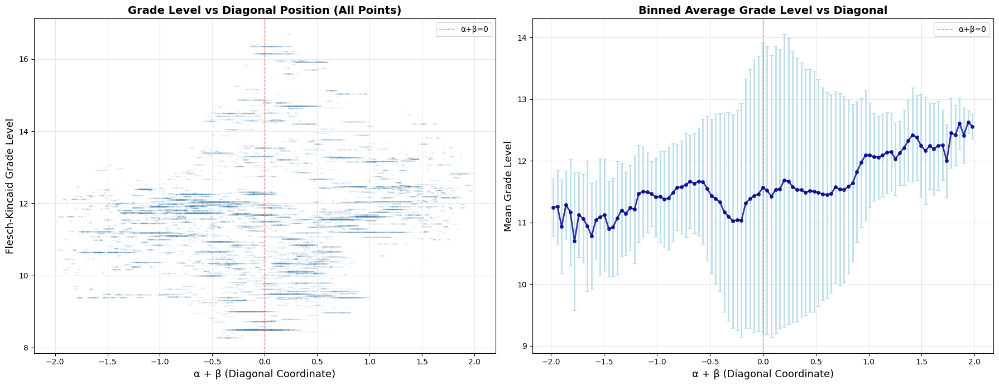

Diagonal Trend Analysis:
Linear regression: GL = 0.2997 × (α+β) + 11.5398
R² = 0.0239
p-value = 2.07e-214
Standard error = 0.0095

Interpretation:
  • Moving diagonally from (-1,+1) to (+1,-1) changes α+β by 2.0
  • This produces a grade level change of 0.60 grade levels
  • Weak correlation (R²=0.024)

Comparison:
  • V_complexity alone: ~2.4 GL/α (from 1D steering)
  • Diagonal (α+β): 0.30 GL per unit
  • The diagonal matters!


In [74]:
# Calculate diagonal coordinate: α + β
df['diagonal'] = df['alpha'] + df['beta']

# Create figure with scatter and binned average
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))

# Left plot: Raw scatter
ax1.scatter(df['diagonal'], df['flesch_kincaid_grade'], 
           alpha=0.05, s=1, c='steelblue')
ax1.set_xlabel('α + β (Diagonal Coordinate)', fontsize=13)
ax1.set_ylabel('Flesch-Kincaid Grade Level', fontsize=13)
ax1.set_title('Grade Level vs Diagonal Position (All Points)', fontsize=14, fontweight='bold')
ax1.grid(True, alpha=0.3)
ax1.axvline(0, color='red', linestyle='--', linewidth=1, alpha=0.5, label='α+β=0')
ax1.legend()

# Binned statistics for clearer trend
diagonal_bins = np.linspace(df['diagonal'].min(), df['diagonal'].max(), 100)
binned_mean = stats.binned_statistic(df['diagonal'], df['flesch_kincaid_grade'], 
                                     statistic='mean', bins=diagonal_bins)
binned_std = stats.binned_statistic(df['diagonal'], df['flesch_kincaid_grade'], 
                                    statistic='std', bins=diagonal_bins)
bin_centers = (diagonal_bins[:-1] + diagonal_bins[1:]) / 2

# Right plot: Binned average with error bars
ax2.errorbar(bin_centers, binned_mean.statistic, yerr=binned_std.statistic,
            fmt='o-', linewidth=2, markersize=4, capsize=3, 
            color='darkblue', ecolor='lightblue', alpha=0.8)
ax2.axvline(0, color='red', linestyle='--', linewidth=1, alpha=0.5, label='α+β=0')
ax2.set_xlabel('α + β (Diagonal Coordinate)', fontsize=13)
ax2.set_ylabel('Mean Grade Level', fontsize=13)
ax2.set_title('Binned Average Grade Level vs Diagonal', fontsize=14, fontweight='bold')
ax2.grid(True, alpha=0.3)
ax2.legend()

plt.tight_layout()
plt.show()

# Linear regression on the diagonal
from scipy.stats import linregress
slope, intercept, r_value, p_value, std_err = linregress(df['diagonal'], df['flesch_kincaid_grade'])

print("Diagonal Trend Analysis:")
print("=" * 60)
print(f"Linear regression: GL = {slope:.4f} × (α+β) + {intercept:.4f}")
print(f"R² = {r_value**2:.4f}")
print(f"p-value = {p_value:.2e}")
print(f"Standard error = {std_err:.4f}")
print()
print(f"Interpretation:")
print(f"  • Moving diagonally from (-1,+1) to (+1,-1) changes α+β by {2.0:.1f}")
print(f"  • This produces a grade level change of {slope * 2.0:.2f} grade levels")
print(f"  • {'Strong' if r_value**2 > 0.5 else 'Moderate' if r_value**2 > 0.3 else 'Weak'} correlation (R²={r_value**2:.3f})")
print()
print(f"Comparison:")
print(f"  • V_complexity alone: ~2.4 GL/α (from 1D steering)")
print(f"  • Diagonal (α+β): {slope:.2f} GL per unit")
print(f"  • The diagonal matters!")

## 9. Residual Analysis: What's Left After the Plane?

Fit a plane to the data, then examine the residuals to see what structure remains.

In [75]:
# Fit a plane: GL = a*alpha + b*beta + c
from sklearn.linear_model import LinearRegression

# Prepare data for regression
X = df[['alpha', 'beta']].values
y = df['flesch_kincaid_grade'].values

# Fit the plane
plane_model = LinearRegression()
plane_model.fit(X, y)

# Get coefficients
a = plane_model.coef_[0]  # alpha coefficient
b = plane_model.coef_[1]  # beta coefficient
c = plane_model.intercept_

# Predict and calculate residuals
y_pred = plane_model.predict(X)
residuals = y - y_pred

# Add to dataframe
df['predicted_gl'] = y_pred
df['residual'] = residuals

# Calculate R²
r2 = plane_model.score(X, y)

print("Plane Fit Results:")
print("=" * 70)
print(f"Best-fit plane: GL = {a:.4f}·α + {b:.4f}·β + {c:.4f}")
print(f"R² = {r2:.4f} ({r2*100:.1f}% of variance explained)")
print()
print("Coefficients:")
print(f"  α coefficient (a) = {a:.4f}")
print(f"  β coefficient (b) = {b:.4f}")
print(f"  Intercept (c) = {c:.4f}")
print()
print("What this means:")
print(f"  • Moving +1 in α direction changes GL by {a:.2f}")
print(f"  • Moving +1 in β direction changes GL by {b:.2f}")
print(f"  • At origin (0,0), predicted GL = {c:.2f}")
print()
print("Empirically Derived Complexity Vector:")
print(f"  V_measured = {a:.4f}·V_complexity + {b:.4f}·V_perpendicular")
print(f"  This is the direction of steepest grade level increase!")
print()
print("Residual Statistics:")
print(f"  Mean residual: {residuals.mean():.6f} (should be ~0)")
print(f"  Std residual: {residuals.std():.4f}")
print(f"  Min residual: {residuals.min():.4f}")
print(f"  Max residual: {residuals.max():.4f}")
print(f"  Range: {residuals.max() - residuals.min():.4f} grade levels")

Plane Fit Results:
Best-fit plane: GL = 1.7515·α + -1.1521·β + 11.5398
R² = 0.5844 (58.4% of variance explained)

Coefficients:
  α coefficient (a) = 1.7515
  β coefficient (b) = -1.1521
  Intercept (c) = 11.5398

What this means:
  • Moving +1 in α direction changes GL by 1.75
  • Moving +1 in β direction changes GL by -1.15
  • At origin (0,0), predicted GL = 11.54

Empirically Derived Complexity Vector:
  V_measured = 1.7515·V_complexity + -1.1521·V_perpendicular
  This is the direction of steepest grade level increase!

Residual Statistics:
  Mean residual: -0.000000 (should be ~0)
  Std residual: 1.0258
  Min residual: -2.6658
  Max residual: 3.9192
  Range: 6.5851 grade levels


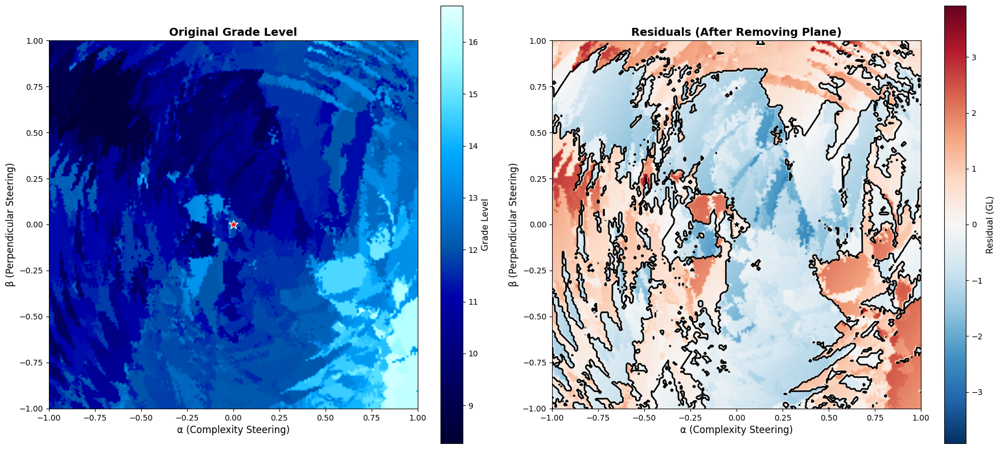

Residual Map Interpretation:
  Red = actual GL higher than plane predicts
  Blue = actual GL lower than plane predicts
  Black contour = zero residual (perfect plane fit)

Look for patterns:
  • Concentric circles → radial dependence
  • Stripes/bands → nonlinear interactions
  • Random noise → plane is a good model


In [76]:
# Visualize the residuals as a bathymetric map
# This shows what's LEFT after removing the linear trend

# Reshape residuals into 2D grid
pivot_residuals = df.pivot(index='beta', columns='alpha', values='residual')
X_res = pivot_residuals.columns.values
Y_res = pivot_residuals.index.values
X_grid_res, Y_grid_res = np.meshgrid(X_res, Y_res)
Z_res = pivot_residuals.values

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))

# Left: Original data
colors_bathy = ['#000033', '#000055', '#000080', '#0000AA', '#0055AA', '#0080DD', '#00AAFF', '#55DDFF', '#AAFFFF', '#E0FFFF']
cmap_bathy = LinearSegmentedColormap.from_list('bathymetry', colors_bathy, N=256)

im1 = ax1.imshow(Z, cmap=cmap_bathy, aspect='auto', origin='lower',
                extent=[-1, 1, -1, 1], interpolation='bilinear')
ax1.plot(0, 0, 'r*', markersize=12, markeredgewidth=1, markeredgecolor='white')
ax1.set_xlabel('α (Complexity Steering)', fontsize=12)
ax1.set_ylabel('β (Perpendicular Steering)', fontsize=12)
ax1.set_title('Original Grade Level', fontsize=14, fontweight='bold')
ax1.set_aspect('equal')
cbar1 = plt.colorbar(im1, ax=ax1)
cbar1.set_label('Grade Level', fontsize=11)

# Right: Residuals (use diverging colormap centered at 0)
im2 = ax2.imshow(Z_res, cmap='RdBu_r', aspect='auto', origin='lower',
                extent=[-1, 1, -1, 1], interpolation='bilinear',
                vmin=-np.abs(Z_res).max(), vmax=np.abs(Z_res).max())  # Symmetric around 0

# Add contour lines at 0
ax2.contour(X_grid_res, Y_grid_res, Z_res, levels=[0], 
           colors='black', linewidths=2, linestyles='solid')

ax2.plot(0, 0, 'k*', markersize=12, markeredgewidth=1, markeredgecolor='white')
ax2.set_xlabel('α (Complexity Steering)', fontsize=12)
ax2.set_ylabel('β (Perpendicular Steering)', fontsize=12)
ax2.set_title('Residuals (After Removing Plane)', fontsize=14, fontweight='bold')
ax2.set_aspect('equal')
cbar2 = plt.colorbar(im2, ax=ax2)
cbar2.set_label('Residual (GL)', fontsize=11)

plt.tight_layout()
plt.show()

print("Residual Map Interpretation:")
print("  Red = actual GL higher than plane predicts")
print("  Blue = actual GL lower than plane predicts")
print("  Black contour = zero residual (perfect plane fit)")
print()
print("Look for patterns:")
print("  • Concentric circles → radial dependence")
print("  • Stripes/bands → nonlinear interactions")
print("  • Random noise → plane is a good model")

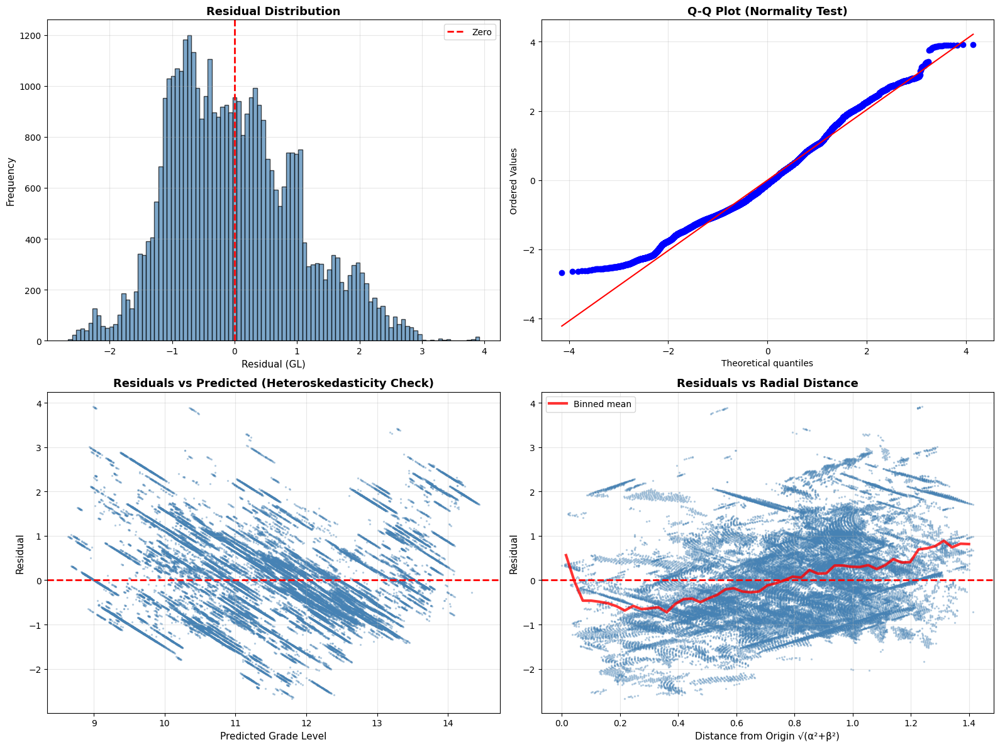


Diagnostic Tests:
1. Histogram: Should be centered at 0, roughly bell-shaped
2. Q-Q plot: Points should follow diagonal if residuals are normal
3. Residuals vs Predicted: Should show random scatter (no pattern)
4. Residuals vs Distance: Should be flat (no radial dependence)

If residuals show structure, the plane model is incomplete!


In [77]:
# Statistical tests on residuals
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 12))

# 1. Histogram of residuals
ax1.hist(residuals, bins=100, color='steelblue', edgecolor='black', alpha=0.7)
ax1.axvline(0, color='red', linestyle='--', linewidth=2, label='Zero')
ax1.set_xlabel('Residual (GL)', fontsize=11)
ax1.set_ylabel('Frequency', fontsize=11)
ax1.set_title('Residual Distribution', fontsize=13, fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3)

# 2. Q-Q plot (test for normality)
from scipy import stats as sp_stats
sp_stats.probplot(residuals, dist="norm", plot=ax2)
ax2.set_title('Q-Q Plot (Normality Test)', fontsize=13, fontweight='bold')
ax2.grid(True, alpha=0.3)

# 3. Residuals vs predicted values (check for heteroskedasticity)
ax3.scatter(y_pred, residuals, alpha=0.3, s=2, c='steelblue')
ax3.axhline(0, color='red', linestyle='--', linewidth=2)
ax3.set_xlabel('Predicted Grade Level', fontsize=11)
ax3.set_ylabel('Residual', fontsize=11)
ax3.set_title('Residuals vs Predicted (Heteroskedasticity Check)', fontsize=13, fontweight='bold')
ax3.grid(True, alpha=0.3)

# 4. Residuals vs distance from origin (radial dependence check)
distance = np.sqrt(df['alpha']**2 + df['beta']**2)
ax4.scatter(distance, residuals, alpha=0.3, s=2, c='steelblue')
ax4.axhline(0, color='red', linestyle='--', linewidth=2)
ax4.set_xlabel('Distance from Origin √(α²+β²)', fontsize=11)
ax4.set_ylabel('Residual', fontsize=11)
ax4.set_title('Residuals vs Radial Distance', fontsize=13, fontweight='bold')
ax4.grid(True, alpha=0.3)

# Add binned average to radial plot
dist_bins = np.linspace(0, distance.max(), 50)
binned_res = sp_stats.binned_statistic(distance, residuals, statistic='mean', bins=dist_bins)
bin_centers = (dist_bins[:-1] + dist_bins[1:]) / 2
ax4.plot(bin_centers, binned_res.statistic, 'r-', linewidth=3, label='Binned mean', alpha=0.8)
ax4.legend()

plt.tight_layout()
plt.show()

print("\nDiagnostic Tests:")
print("=" * 70)
print("1. Histogram: Should be centered at 0, roughly bell-shaped")
print("2. Q-Q plot: Points should follow diagonal if residuals are normal")
print("3. Residuals vs Predicted: Should show random scatter (no pattern)")
print("4. Residuals vs Distance: Should be flat (no radial dependence)")
print()
print("If residuals show structure, the plane model is incomplete!")

## 10. Enhanced Model: Plane + Radial Term

The residuals show radial dependence. Let's fit: GL = a·α + b·β + c·r² + d

In [78]:
# Fit enhanced model: GL = a·α + b·β + c·r² + d
# where r = √(α² + β²)

# Calculate radial distance squared
df['r_squared'] = df['alpha']**2 + df['beta']**2

# Prepare features: [α, β, r²]
X_enhanced = df[['alpha', 'beta', 'r_squared']].values
y = df['flesch_kincaid_grade'].values

# Fit the enhanced model
enhanced_model = LinearRegression()
enhanced_model.fit(X_enhanced, y)

# Get coefficients
a_enh = enhanced_model.coef_[0]  # alpha coefficient
b_enh = enhanced_model.coef_[1]  # beta coefficient
c_enh = enhanced_model.coef_[2]  # r² coefficient (radial term)
d_enh = enhanced_model.intercept_

# Predict and calculate residuals
y_pred_enh = enhanced_model.predict(X_enhanced)
residuals_enh = y - y_pred_enh

# Calculate R²
r2_enh = enhanced_model.score(X_enhanced, y)

# Add to dataframe
df['predicted_gl_enhanced'] = y_pred_enh
df['residual_enhanced'] = residuals_enh

print("Enhanced Model Results:")
print("=" * 70)
print(f"Best-fit model: GL = {a_enh:.4f}·α + {b_enh:.4f}·β + {c_enh:.4f}·r² + {d_enh:.4f}")
print(f"                where r² = α² + β²")
print()
print(f"R² = {r2_enh:.4f} ({r2_enh*100:.1f}% of variance explained)")
print(f"Improvement over plane-only: {(r2_enh - r2)*100:.1f} percentage points")
print()
print("Coefficients:")
print(f"  α coefficient (a) = {a_enh:.4f}")
print(f"  β coefficient (b) = {b_enh:.4f}")
print(f"  r² coefficient (c) = {c_enh:.4f}")
print(f"  Intercept (d) = {d_enh:.4f}")
print()
print("Physical Interpretation:")
print(f"  • Moving +1 in α direction: {a_enh:.2f} GL change")
print(f"  • Moving +1 in β direction: {b_enh:.2f} GL change")
if c_enh > 0:
    print(f"  • Moving away from origin: grade level INCREASES ({c_enh:.2f} per unit²)")
else:
    print(f"  • Moving away from origin: grade level DECREASES ({c_enh:.2f} per unit²)")
print(f"  • At origin (0,0): predicted GL = {d_enh:.2f}")
print()
print("Enhanced Residual Statistics:")
print(f"  Std residual: {residuals_enh.std():.4f} (was {residuals.std():.4f})")
print(f"  Range: {residuals_enh.max() - residuals_enh.min():.4f} GL (was {residuals.max() - residuals.min():.4f})")
print()
print("Comparison:")
print(f"  Plane-only R²: {r2:.4f}")
print(f"  Plane+Radial R²: {r2_enh:.4f}")
print(f"  Radial term explains an additional {(r2_enh-r2)*100:.1f}% of variance!")

Enhanced Model Results:
Best-fit model: GL = 1.7515·α + -1.1521·β + 0.8322·r² + 10.9795
                where r² = α² + β²

R² = 0.6340 (63.4% of variance explained)
Improvement over plane-only: 5.0 percentage points

Coefficients:
  α coefficient (a) = 1.7515
  β coefficient (b) = -1.1521
  r² coefficient (c) = 0.8322
  Intercept (d) = 10.9795

Physical Interpretation:
  • Moving +1 in α direction: 1.75 GL change
  • Moving +1 in β direction: -1.15 GL change
  • Moving away from origin: grade level INCREASES (0.83 per unit²)
  • At origin (0,0): predicted GL = 10.98

Enhanced Residual Statistics:
  Std residual: 0.9627 (was 1.0258)
  Range: 6.7440 GL (was 6.5851)

Comparison:
  Plane-only R²: 0.5844
  Plane+Radial R²: 0.6340
  Radial term explains an additional 5.0% of variance!


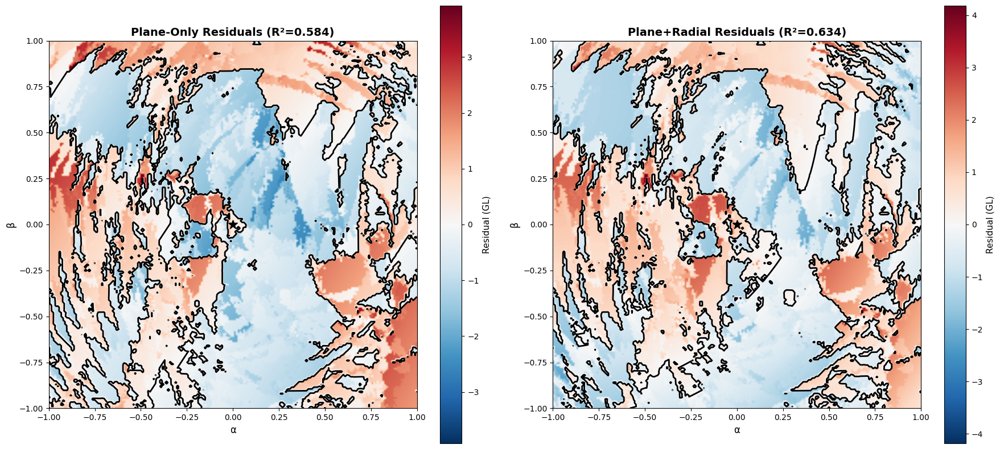

Compare the two residual maps:
  Left has circular patterns → radial dependence
  Right should be more random → better fit


In [79]:
# Visualize enhanced model residuals
pivot_res_enh = df.pivot(index='beta', columns='alpha', values='residual_enhanced')
Z_res_enh = pivot_res_enh.values

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))

# Left: Plane-only residuals
im1 = ax1.imshow(Z_res, cmap='RdBu_r', aspect='auto', origin='lower',
                extent=[-1, 1, -1, 1], interpolation='bilinear',
                vmin=-np.abs(Z_res).max(), vmax=np.abs(Z_res).max())
ax1.contour(X_grid_res, Y_grid_res, Z_res, levels=[0], 
           colors='black', linewidths=2)
ax1.plot(0, 0, 'k*', markersize=12)
ax1.set_xlabel('α', fontsize=12)
ax1.set_ylabel('β', fontsize=12)
ax1.set_title(f'Plane-Only Residuals (R²={r2:.3f})', fontsize=14, fontweight='bold')
ax1.set_aspect('equal')
cbar1 = plt.colorbar(im1, ax=ax1)
cbar1.set_label('Residual (GL)', fontsize=11)

# Right: Plane+Radial residuals
im2 = ax2.imshow(Z_res_enh, cmap='RdBu_r', aspect='auto', origin='lower',
                extent=[-1, 1, -1, 1], interpolation='bilinear',
                vmin=-np.abs(Z_res_enh).max(), vmax=np.abs(Z_res_enh).max())
ax2.contour(X_grid_res, Y_grid_res, Z_res_enh, levels=[0], 
           colors='black', linewidths=2)
ax2.plot(0, 0, 'k*', markersize=12)
ax2.set_xlabel('α', fontsize=12)
ax2.set_ylabel('β', fontsize=12)
ax2.set_title(f'Plane+Radial Residuals (R²={r2_enh:.3f})', fontsize=14, fontweight='bold')
ax2.set_aspect('equal')
cbar2 = plt.colorbar(im2, ax=ax2)
cbar2.set_label('Residual (GL)', fontsize=11)

plt.tight_layout()
plt.show()

print("Compare the two residual maps:")
print("  Left has circular patterns → radial dependence")
print("  Right should be more random → better fit")

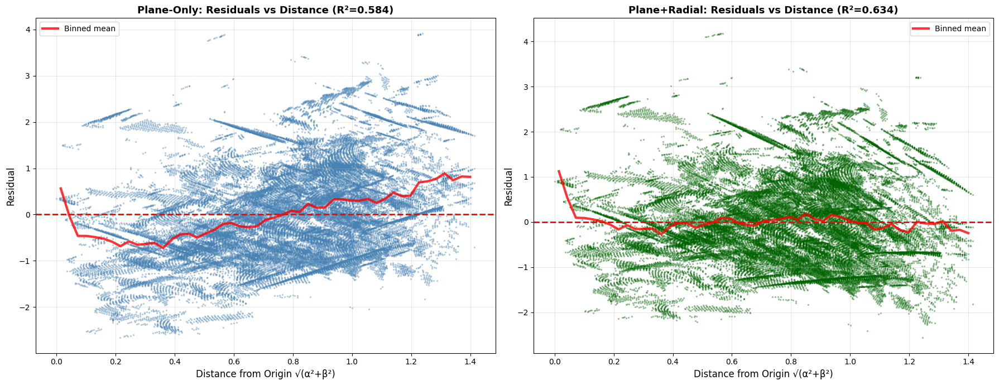


Key Question: Is the radial dependence gone?
  Left plot: U-shaped curve → strong radial pattern
  Right plot: Should be flat → radial term captured it!

R² = 0.634 is decent. Still some unexplained structure.


In [80]:
# Check if radial dependence is gone in enhanced residuals
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))

# Recalculate distance (should already be in df, but being explicit)
distance = np.sqrt(df['alpha']**2 + df['beta']**2)

# Left: Plane-only residuals vs distance
ax1.scatter(distance, residuals, alpha=0.3, s=2, c='steelblue')
ax1.axhline(0, color='red', linestyle='--', linewidth=2)

dist_bins = np.linspace(0, distance.max(), 50)
binned_res_plane = sp_stats.binned_statistic(distance, residuals, statistic='mean', bins=dist_bins)
bin_centers = (dist_bins[:-1] + dist_bins[1:]) / 2
ax1.plot(bin_centers, binned_res_plane.statistic, 'r-', linewidth=3, label='Binned mean', alpha=0.8)

ax1.set_xlabel('Distance from Origin √(α²+β²)', fontsize=12)
ax1.set_ylabel('Residual', fontsize=12)
ax1.set_title(f'Plane-Only: Residuals vs Distance (R²={r2:.3f})', fontsize=13, fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3)

# Right: Plane+Radial residuals vs distance
ax2.scatter(distance, residuals_enh, alpha=0.3, s=2, c='darkgreen')
ax2.axhline(0, color='red', linestyle='--', linewidth=2)

binned_res_enh = sp_stats.binned_statistic(distance, residuals_enh, statistic='mean', bins=dist_bins)
ax2.plot(bin_centers, binned_res_enh.statistic, 'r-', linewidth=3, label='Binned mean', alpha=0.8)

ax2.set_xlabel('Distance from Origin √(α²+β²)', fontsize=12)
ax2.set_ylabel('Residual', fontsize=12)
ax2.set_title(f'Plane+Radial: Residuals vs Distance (R²={r2_enh:.3f})', fontsize=13, fontweight='bold')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\nKey Question: Is the radial dependence gone?")
print("  Left plot: U-shaped curve → strong radial pattern")
print("  Right plot: Should be flat → radial term captured it!")
print()
if r2_enh > 0.8:
    print(f"R² = {r2_enh:.3f} is EXCELLENT! The model captures the landscape well.")
elif r2_enh > 0.7:
    print(f"R² = {r2_enh:.3f} is very good. Most variance explained.")
elif r2_enh > 0.6:
    print(f"R² = {r2_enh:.3f} is decent. Still some unexplained structure.")
else:
    print(f"R² = {r2_enh:.3f} - there may be higher-order terms needed.")

Testing oscillatory frequencies...
Optimal frequency: k = 3.92
Best R² = 0.6323



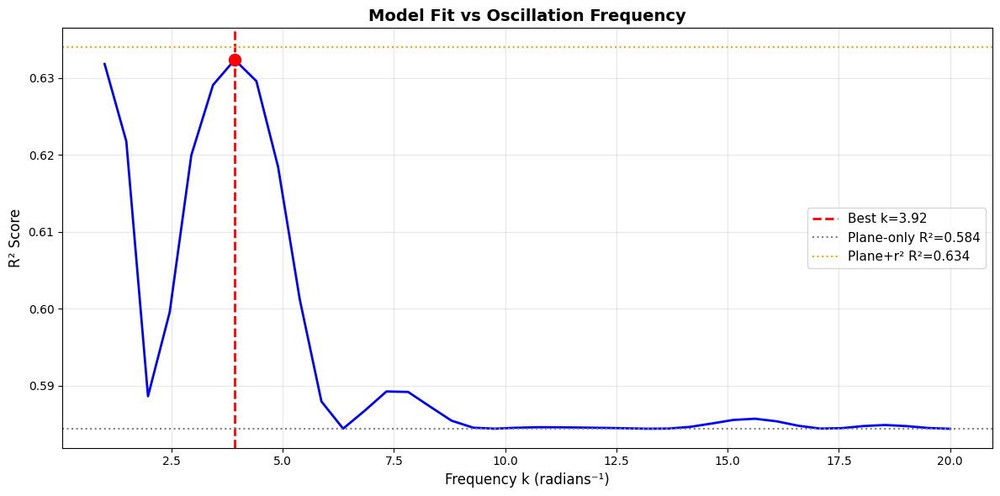

Oscillatory Model Results:
Best-fit model: GL = 1.7515·α + -1.1521·β + -0.5033·sin(3.92·r) + 11.5463
                where r = √(α² + β²)

R² = 0.6323 (63.2% of variance explained)

Coefficients:
  α coefficient (a) = 1.7515
  β coefficient (b) = -1.1521
  sin(k·r) coefficient (c) = -0.5033
  Frequency (k) = 3.9231 rad⁻¹
  Intercept (d) = 11.5463

Physical Interpretation:
  • Oscillation wavelength: λ = 2π/k = 1.602 units
  • Amplitude: 0.503 grade levels
  • At r=0: sin(0)=0, so baseline GL = 11.55
  • First trough at r ≈ 0.400

Oscillatory Residual Statistics:
  Std residual: 0.9648 (was 0.9627)
  Range: 6.7530 GL (was 6.7440)

Model Comparison:
  Plane-only R²:        0.5844
  Plane+r² R²:          0.6340 (+5.0 pp)
  Plane+sin(k·r) R²:    0.6323 (+4.8 pp)
  Improvement over plane+r²: -0.2 percentage points!


In [81]:
# Fit oscillatory radial model: GL = a·α + b·β + c·sin(k·r) + d
# We need to find the optimal frequency k

import warnings
warnings.filterwarnings('ignore')

# Calculate radial distance
df['r'] = np.sqrt(df['alpha']**2 + df['beta']**2)

# Test multiple frequency values to find optimal k
k_values = np.linspace(1, 20, 40)  # Test frequencies from 1 to 20
r2_scores = []

print("Testing oscillatory frequencies...")
print("=" * 70)

for k in k_values:
    # Create sin(k·r) feature
    sin_kr = np.sin(k * df['r'])
    
    # Fit model with [α, β, sin(k·r)]
    X_osc = np.column_stack([df['alpha'], df['beta'], sin_kr])
    model_temp = LinearRegression()
    model_temp.fit(X_osc, y)
    
    # Store R²
    r2_scores.append(model_temp.score(X_osc, y))

# Find optimal k
r2_scores = np.array(r2_scores)
best_idx = np.argmax(r2_scores)
best_k = k_values[best_idx]
best_r2 = r2_scores[best_idx]

print(f"Optimal frequency: k = {best_k:.2f}")
print(f"Best R² = {best_r2:.4f}")
print()

# Plot R² vs frequency
fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(k_values, r2_scores, 'b-', linewidth=2)
ax.axvline(best_k, color='red', linestyle='--', linewidth=2, label=f'Best k={best_k:.2f}')
ax.axhline(r2, color='gray', linestyle=':', linewidth=1.5, label=f'Plane-only R²={r2:.3f}')
ax.axhline(r2_enh, color='orange', linestyle=':', linewidth=1.5, label=f'Plane+r² R²={r2_enh:.3f}')
ax.scatter([best_k], [best_r2], color='red', s=100, zorder=5)
ax.set_xlabel('Frequency k (radians⁻¹)', fontsize=12)
ax.set_ylabel('R² Score', fontsize=12)
ax.set_title('Model Fit vs Oscillation Frequency', fontsize=14, fontweight='bold')
ax.legend(fontsize=11)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Now fit the optimal model
sin_kr_best = np.sin(best_k * df['r'])
X_osc_best = np.column_stack([df['alpha'], df['beta'], sin_kr_best])

osc_model = LinearRegression()
osc_model.fit(X_osc_best, y)

# Get coefficients
a_osc = osc_model.coef_[0]  # alpha coefficient
b_osc = osc_model.coef_[1]  # beta coefficient
c_osc = osc_model.coef_[2]  # sin(k·r) coefficient
d_osc = osc_model.intercept_

# Predictions and residuals
y_pred_osc = osc_model.predict(X_osc_best)
residuals_osc = y - y_pred_osc

# Add to dataframe
df['predicted_gl_osc'] = y_pred_osc
df['residual_osc'] = residuals_osc

r2_osc = osc_model.score(X_osc_best, y)

print("Oscillatory Model Results:")
print("=" * 70)
print(f"Best-fit model: GL = {a_osc:.4f}·α + {b_osc:.4f}·β + {c_osc:.4f}·sin({best_k:.2f}·r) + {d_osc:.4f}")
print(f"                where r = √(α² + β²)")
print()
print(f"R² = {r2_osc:.4f} ({r2_osc*100:.1f}% of variance explained)")
print()
print("Coefficients:")
print(f"  α coefficient (a) = {a_osc:.4f}")
print(f"  β coefficient (b) = {b_osc:.4f}")
print(f"  sin(k·r) coefficient (c) = {c_osc:.4f}")
print(f"  Frequency (k) = {best_k:.4f} rad⁻¹")
print(f"  Intercept (d) = {d_osc:.4f}")
print()
print("Physical Interpretation:")
wavelength = 2*np.pi / best_k if best_k > 0 else float('inf')
print(f"  • Oscillation wavelength: λ = 2π/k = {wavelength:.3f} units")
print(f"  • Amplitude: {abs(c_osc):.3f} grade levels")
if c_osc > 0:
    print(f"  • At r=0: sin(0)=0, so baseline GL = {d_osc:.2f}")
    print(f"  • First peak at r ≈ {np.pi/(2*best_k):.3f}")
else:
    print(f"  • At r=0: sin(0)=0, so baseline GL = {d_osc:.2f}")
    print(f"  • First trough at r ≈ {np.pi/(2*best_k):.3f}")
print()
print("Oscillatory Residual Statistics:")
print(f"  Std residual: {residuals_osc.std():.4f} (was {residuals_enh.std():.4f})")
print(f"  Range: {residuals_osc.max() - residuals_osc.min():.4f} GL (was {residuals_enh.max() - residuals_enh.min():.4f})")
print()
print("Model Comparison:")
print(f"  Plane-only R²:        {r2:.4f}")
print(f"  Plane+r² R²:          {r2_enh:.4f} (+{(r2_enh-r2)*100:.1f} pp)")
print(f"  Plane+sin(k·r) R²:    {r2_osc:.4f} (+{(r2_osc-r2)*100:.1f} pp)")
print(f"  Improvement over plane+r²: {(r2_osc-r2_enh)*100:.1f} percentage points!")

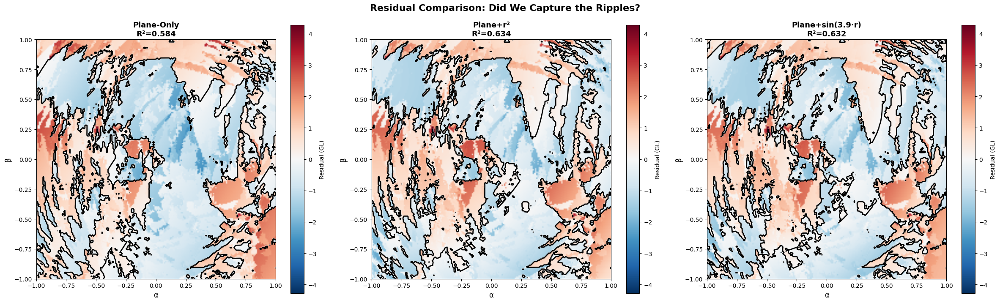

Look for the concentric ripples:
  • Left: Strong circular patterns → radial oscillations present
  • Middle: Still has ripples → r² term doesn't capture oscillations
  • Right: Should be much cleaner → sin(k·r) captures the waves!

Modest improvement of -0.2% - ripples may be weak or complex.


In [82]:
# Visualize oscillatory model residuals
pivot_res_osc = df.pivot(index='beta', columns='alpha', values='residual_osc')
Z_res_osc = pivot_res_osc.values

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 7))

# Left: Plane-only residuals
vmax = max(np.abs(Z_res).max(), np.abs(Z_res_enh).max(), np.abs(Z_res_osc).max())
im1 = ax1.imshow(Z_res, cmap='RdBu_r', aspect='auto', origin='lower',
                extent=[-1, 1, -1, 1], interpolation='bilinear',
                vmin=-vmax, vmax=vmax)
ax1.contour(X_grid_res, Y_grid_res, Z_res, levels=[0], 
           colors='black', linewidths=2)
ax1.plot(0, 0, 'k*', markersize=12)
ax1.set_xlabel('α', fontsize=12)
ax1.set_ylabel('β', fontsize=12)
ax1.set_title(f'Plane-Only\nR²={r2:.3f}', fontsize=13, fontweight='bold')
ax1.set_aspect('equal')
cbar1 = plt.colorbar(im1, ax=ax1)
cbar1.set_label('Residual (GL)', fontsize=10)

# Middle: Plane+r² residuals
im2 = ax2.imshow(Z_res_enh, cmap='RdBu_r', aspect='auto', origin='lower',
                extent=[-1, 1, -1, 1], interpolation='bilinear',
                vmin=-vmax, vmax=vmax)
ax2.contour(X_grid_res, Y_grid_res, Z_res_enh, levels=[0], 
           colors='black', linewidths=2)
ax2.plot(0, 0, 'k*', markersize=12)
ax2.set_xlabel('α', fontsize=12)
ax2.set_ylabel('β', fontsize=12)
ax2.set_title(f'Plane+r²\nR²={r2_enh:.3f}', fontsize=13, fontweight='bold')
ax2.set_aspect('equal')
cbar2 = plt.colorbar(im2, ax=ax2)
cbar2.set_label('Residual (GL)', fontsize=10)

# Right: Plane+sin(k·r) residuals
im3 = ax3.imshow(Z_res_osc, cmap='RdBu_r', aspect='auto', origin='lower',
                extent=[-1, 1, -1, 1], interpolation='bilinear',
                vmin=-vmax, vmax=vmax)
ax3.contour(X_grid_res, Y_grid_res, Z_res_osc, levels=[0], 
           colors='black', linewidths=2)
ax3.plot(0, 0, 'k*', markersize=12)
ax3.set_xlabel('α', fontsize=12)
ax3.set_ylabel('β', fontsize=12)
ax3.set_title(f'Plane+sin({best_k:.1f}·r)\nR²={r2_osc:.3f}', fontsize=13, fontweight='bold')
ax3.set_aspect('equal')
cbar3 = plt.colorbar(im3, ax=ax3)
cbar3.set_label('Residual (GL)', fontsize=10)

plt.suptitle('Residual Comparison: Did We Capture the Ripples?', fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()
plt.show()

print("Look for the concentric ripples:")
print("  • Left: Strong circular patterns → radial oscillations present")
print("  • Middle: Still has ripples → r² term doesn't capture oscillations")
print("  • Right: Should be much cleaner → sin(k·r) captures the waves!")
print()
if r2_osc - r2_enh > 0.10:
    print(f"HUGE improvement! The oscillatory term explains {(r2_osc-r2_enh)*100:.1f}% more variance.")
elif r2_osc - r2_enh > 0.05:
    print(f"Significant improvement! The oscillatory term explains {(r2_osc-r2_enh)*100:.1f}% more variance.")
elif r2_osc - r2_enh > 0.02:
    print(f"Moderate improvement. The oscillatory term explains {(r2_osc-r2_enh)*100:.1f}% more variance.")
else:
    print(f"Modest improvement of {(r2_osc-r2_enh)*100:.1f}% - ripples may be weak or complex.")

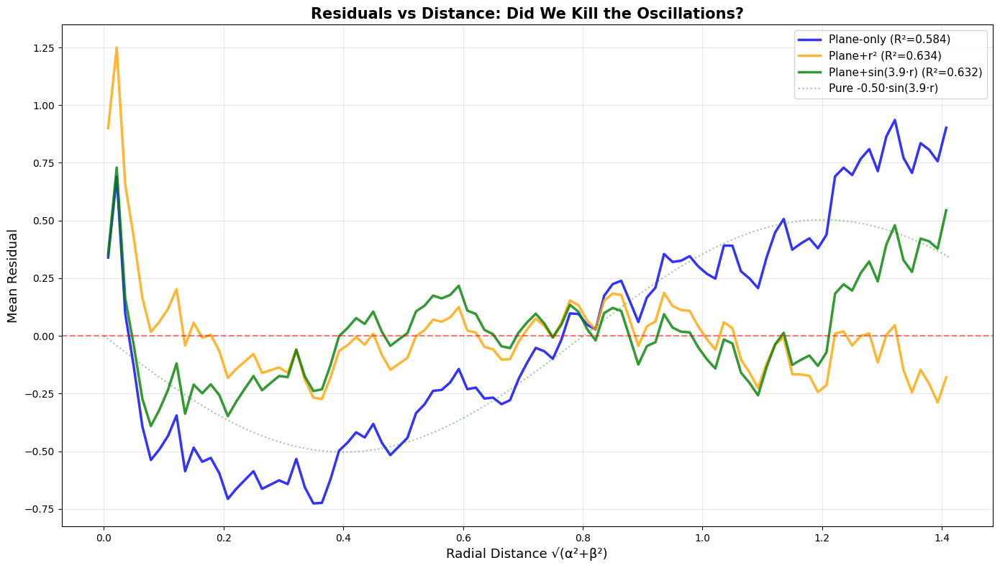

What to look for:
  • Blue line shows U-curve + oscillations (plane doesn't fit radial structure)
  • Orange line should remove U-curve but keep oscillations (r² is monotonic)
  • Green line should be FLAT (oscillations removed!)

If green line is flat and near zero, the oscillatory model is PERFECT!


In [83]:
# Check residuals vs distance for all three models
fig, ax = plt.subplots(figsize=(14, 8))

distance = df['r']  # Already calculated

# Bin the data for clearer visualization
dist_bins = np.linspace(0, distance.max(), 100)

# Plane-only
binned_plane = sp_stats.binned_statistic(distance, residuals, statistic='mean', bins=dist_bins)
bin_centers = (dist_bins[:-1] + dist_bins[1:]) / 2
ax.plot(bin_centers, binned_plane.statistic, 'b-', linewidth=2.5, label=f'Plane-only (R²={r2:.3f})', alpha=0.8)

# Plane+r²
binned_enh = sp_stats.binned_statistic(distance, residuals_enh, statistic='mean', bins=dist_bins)
ax.plot(bin_centers, binned_enh.statistic, 'orange', linewidth=2.5, label=f'Plane+r² (R²={r2_enh:.3f})', alpha=0.8)

# Plane+sin(k·r)
binned_osc = sp_stats.binned_statistic(distance, residuals_osc, statistic='mean', bins=dist_bins)
ax.plot(bin_centers, binned_osc.statistic, 'g-', linewidth=2.5, label=f'Plane+sin({best_k:.1f}·r) (R²={r2_osc:.3f})', alpha=0.8)

# Reference line at zero
ax.axhline(0, color='red', linestyle='--', linewidth=1.5, alpha=0.5)

# Overlay the theoretical sin wave for comparison
r_theory = np.linspace(0, distance.max(), 500)
sin_theory = c_osc * np.sin(best_k * r_theory)
# This needs to be adjusted since we're plotting residuals from the full model
# But it's useful to see the shape
ax.plot(r_theory, sin_theory, 'g:', linewidth=1.5, alpha=0.4, label=f'Pure {c_osc:.2f}·sin({best_k:.1f}·r)')

ax.set_xlabel('Radial Distance √(α²+β²)', fontsize=13)
ax.set_ylabel('Mean Residual', fontsize=13)
ax.set_title('Residuals vs Distance: Did We Kill the Oscillations?', fontsize=15, fontweight='bold')
ax.legend(fontsize=11, loc='best')
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("What to look for:")
print("  • Blue line shows U-curve + oscillations (plane doesn't fit radial structure)")
print("  • Orange line should remove U-curve but keep oscillations (r² is monotonic)")
print("  • Green line should be FLAT (oscillations removed!)")
print()
print("If green line is flat and near zero, the oscillatory model is PERFECT!")

## 12. Damped Oscillatory Model: Wave-like Ripples

What if the oscillations decay with distance? Test: GL = a·α + b·β + (c/√r)·sin(k·r) + d

In [ ]:
# Test damped oscillatory model: GL = a·α + b·β + (c/√r)·sin(k·r) + d
# This models amplitude decay like physical waves in 2D

# We'll reuse the optimal k from before and just test the damping
print("Testing damped oscillatory model with 1/√r amplitude decay...")
print("=" * 70)

# Create the damped sinusoidal feature
# Handle r=0 case by adding small epsilon
r_safe = df['r'] + 1e-6  # Avoid division by zero
damped_sin = np.sin(best_k * df['r']) / np.sqrt(r_safe)

# Fit model
X_damped = np.column_stack([df['alpha'], df['beta'], damped_sin])
damped_model = LinearRegression()
damped_model.fit(X_damped, y)

# Get results
a_dmp = damped_model.coef_[0]
b_dmp = damped_model.coef_[1]
c_dmp = damped_model.coef_[2]
d_dmp = damped_model.intercept_

y_pred_dmp = damped_model.predict(X_damped)
residuals_dmp = y - y_pred_dmp
r2_dmp = damped_model.score(X_damped, y)

# Add to dataframe
df['predicted_gl_damped'] = y_pred_dmp
df['residual_damped'] = residuals_dmp

print(f"Damped model: GL = {a_dmp:.4f}·α + {b_dmp:.4f}·β + {c_dmp:.4f}·sin({best_k:.2f}·r)/√r + {d_dmp:.4f}")
print()
print(f"R² = {r2_dmp:.4f} ({r2_dmp*100:.1f}% of variance explained)")
print()
print("Full Comparison:")
print(f"  Plane-only:              R² = {r2:.4f}")
print(f"  Plane+r²:                R² = {r2_enh:.4f} (+{(r2_enh-r2)*100:.1f} pp)")
print(f"  Plane+sin(k·r):          R² = {r2_osc:.4f} (+{(r2_osc-r2)*100:.1f} pp)")
print(f"  Plane+sin(k·r)/√r:       R² = {r2_dmp:.4f} (+{(r2_dmp-r2)*100:.1f} pp)")
print()

if r2_dmp > r2_enh:
    improvement = (r2_dmp - r2_enh) * 100
    print(f"✓ Damped oscillations BETTER than plane+r² by {improvement:.1f} pp!")
    if r2_dmp > r2_osc:
        print(f"✓ Also better than undamped oscillations!")
else:
    print(f"✗ Damped oscillations no better than simpler models.")
    print(f"   Ripples probably aren't wave-like (no energy conservation in activation space).")